<a href="https://colab.research.google.com/github/gowtham-dd/Data-Science-Basics/blob/main/Hypothesis_testing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Statistical/Hypothesis Tests are used to make the generalization/summarize about the population from the sample. These tests are used to check whether there is a enough evidence in sample data to conclude/deduce that any particular/specific/certain condition is also true for entire population.

These test completely relies on the probability distribution, to support Hypothesis.We perform these tests to know the below :

1) Comparison : Is there any difference between two data-sets/groups/data.

2) Relationship : Is there any connection between two groups/columns/data/variables.

There are various ways to achieve/perform a Statistical/Hypothesis tests on data depending upon the type of variables in the data and type of test.
There are two types of tests in Statistical/Hypothesis Tests.


*   1) Parametric tests
*   2) Non Parametric Tests(distribution-free test)






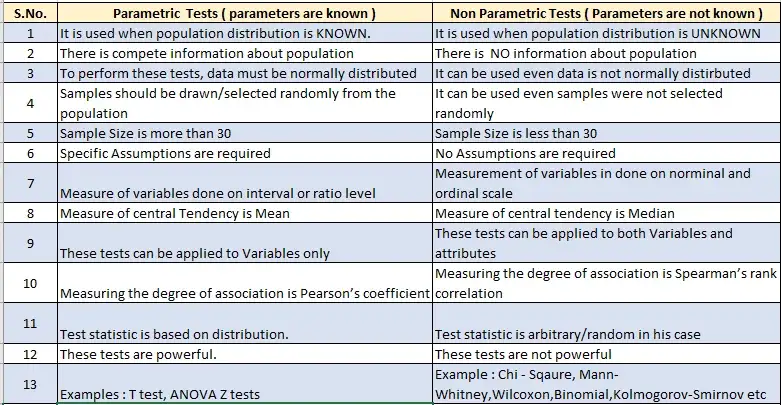

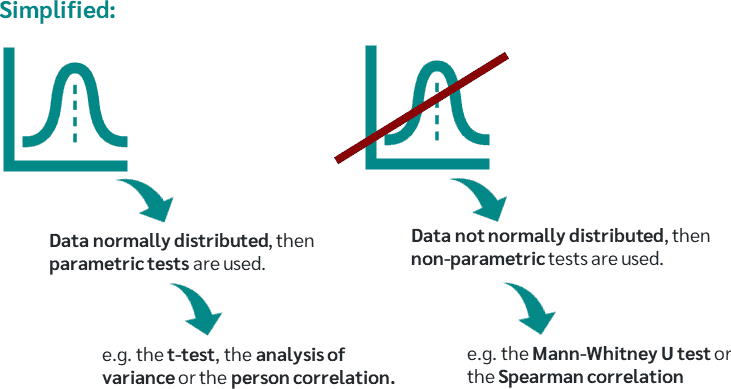

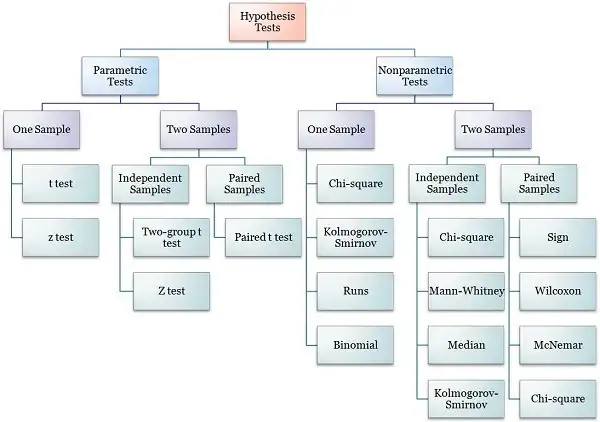

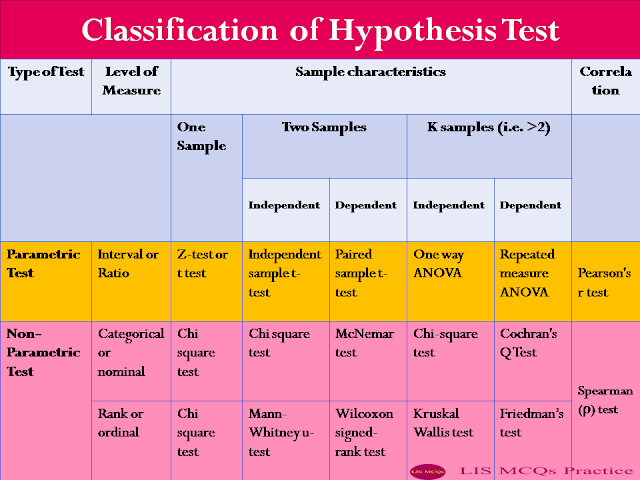

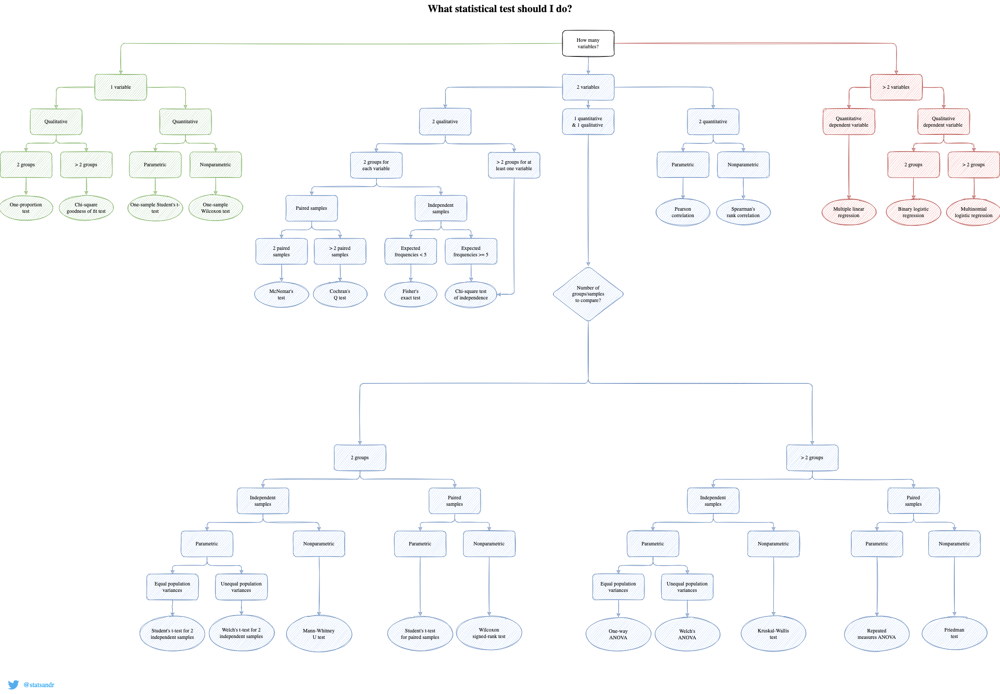

#Normality test


Defining Hypothesis
Since the grades are obtained from the different individuals, the data is unpaired.

H₀: μₛ≤μₐ
H₁: μₛ>μₐ

Assumption Check


H₀: The data is normally distributed.

*   H₀: The data is normally distributed.
*   H₁: The data is not normally
distributed.




Assume that α=0.05. If the p-value is >0.05, it can be said that data is normally distributed.

In [ ]:
def check_normality(data):
    from scipy import stats
    test_stat_normality, p_value_normality=stats.shapiro(data)
    print("p value:%.4f" % p_value_normality)
    if p_value_normality <0.05:
        print("Reject null hypothesis >> The data is not normally distributed")
    else:
        print("Fail to reject null hypothesis >> The data is normally distributed")

A university professor gave online lectures instead of face-to-face classes due to Covid-19. Later, he uploaded recorded lectures to the cloud for students who followed the course asynchronously (those who did not attend the lesson but later watched the records). However, he believes that the students who attend class at the class time and participate in the process are more successful. Therefore, he recorded the average grades of the students at the end of the semester. The data is below.

synchronous = [94. , 84.9, 82.6, 69.5, 80.1, 79.6, 81.4, 77.8, 81.7, 78.8, 73.2, 87.9, 87.9, 93.5, 82.3, 79.3, 78.3, 71.6, 88.6, 74.6, 74.1, 80.6]


asynchronous = [77.1, 71.7, 91. , 72.2, 74.8, 85.1, 67.6, 69.9, 75.3, 71.7, 65.7, 72.6, 71.5, 78.2]

In [ ]:
import numpy as np
sync = np.array([94. , 84.9, 82.6, 69.5, 80.1, 79.6, 81.4, 77.8, 81.7, 78.8, 73.2,87.9, 87.9, 93.5, 82.3, 79.3, 78.3, 71.6, 88.6, 74.6, 74.1, 80.6])
asyncr = np.array([77.1, 71.7, 91. , 72.2, 74.8, 85.1, 67.6, 69.9, 75.3, 71.7, 65.7, 72.6, 71.5, 78.2])
check_normality(sync)
check_normality(asyncr)

p value:0.6556
Fail to reject null hypothesis >> The data is normally distributed
p value:0.0803
Fail to reject null hypothesis >> The data is normally distributed


Assumption check 2 --> for variance homogenetity



*   H₀: The variances of the samples are the same.
*   H₁: The variances of the samples are different.




In [ ]:
def check_variance_homogeneity(group1, group2):
    from scipy import stats
    test_stat_var, p_value_var= stats.levene(group1,group2)
    print("p value:%.4f" % p_value_var)
    if p_value_var <0.05:
        print("Reject null hypothesis >> The variances of the samples are different.")
    else:
        print("Fail to reject null hypothesis >> The variances of the samples are same.")

It tests the null hypothesis that the population variances are equal (called homogeneity of variance or homoscedasticity).

#Dependent samples are paired measurements for one set of items. Independent samples are measurements made on two different sets of items.

In [ ]:
check_variance_homogeneity(sync, asyncr)

p value:0.8149
Fail to reject null hypothesis >> The variances of the samples are same.


Since assumptions are satisfied, we can perform the parametric version of the test for 2 groups and unpaired data.

In [ ]:
from scipy import stats
ttest,p_value = stats.ttest_ind(sync,asyncr)
print("p value:%.8f" % p_value)
#print("since the hypothesis is one sided >> use p_value/2 >> p_value_one_sided:%.4f" %(p_value/2))
if p_value <0.05:
    print("Reject null hypothesis")
else:
    print("Fail to reject null hypothesis")

p value:0.00753598
Reject null hypothesis


If the p-value is less than your significance level (e.g., 0.05), you can reject the null hypothesis. The difference between the two means is statistically significant. Your sample provides strong enough evidence to conclude that the two population means are not equal.



*   H0 assumed is there is no difference in the asyn and sync group (they are independent)
*   H1 :there is difference between async and sync groups (dependent on i.e(whether they attend the class in sync or not))


so we conclude that there is a difference in there marks because of the mode of listening


#ANOVA

A pediatrician wants to see the effect of formula consumption on the average monthly weight gain (in gr) of babies. For this reason, she collected data from three different groups. The first group is exclusively breastfed children (receives only breast milk), the second group is children who are fed with only formula and the last group is both formula and breastfed children. These data are as below.

only_breast=[794.1, 716.9, 993. , 724.7, 760.9, 908.2, 659.3 , 690.8, 768.7, 717.3 , 630.7, 729.5, 714.1, 810.3, 583.5, 679.9, 865.1]

only_formula=[ 898.8, 881.2, 940.2, 966.2, 957.5, 1061.7, 1046.2, 980.4, 895.6, 919.7, 1074.1, 952.5, 796.3, 859.6, 871.1 , 1047.5, 919.1 , 1160.5, 996.9]

both=[976.4, 656.4, 861.2, 706.8, 718.5, 717.1, 759.8, 894.6, 867.6, 805.6, 765.4, 800.3, 789.9, 875.3, 740. , 799.4, 790.3, 795.2 , 823.6, 818.7, 926.8, 791.7, 948.3]

According to this information, conduct the hypothesis testing to check whether there is a difference between the average monthly gain of these three groups by using a 0.05 significance level. If there is a significant difference, perform further analysis to find what caused the difference. Before doing hypothesis testing, check the related assumptions.


1. Defining Hypothesis


*   H₀: μ₁=μ₂=μ₃ or The mean of the samples is the same.
*   H₁: At least one of them is different.




2. Assumption Check


*   H₀: The data is normally distributed.

*   H₁: The data is not normally distributed.

Check 2



*   H₀: The variances of the samples are the same.

*   H₁: The variances of the samples are different.




In [ ]:
only_breast=[794.1, 716.9, 993. , 724.7, 760.9, 908.2, 659.3 , 690.8, 768.7, 717.3 , 630.7, 729.5, 714.1, 810.3, 583.5, 679.9, 865.1]

only_formula=[ 898.8, 881.2, 940.2, 966.2, 957.5, 1061.7, 1046.2, 980.4, 895.6, 919.7, 1074.1, 952.5, 796.3, 859.6, 871.1 , 1047.5, 919.1 , 1160.5, 996.9]

both=[976.4, 656.4, 861.2, 706.8, 718.5, 717.1, 759.8, 894.6, 867.6, 805.6, 765.4, 800.3, 789.9, 875.3, 740. , 799.4, 790.3, 795.2 , 823.6, 818.7, 926.8, 791.7, 948.3]

In [ ]:
check_normality(only_breast)
check_normality(only_formula)
check_normality(both)

stat, pvalue_levene= stats.levene(only_breast,only_formula,both)
print("p value:%.4f" % pvalue_levene)
if pvalue_levene <0.05:
    print("Reject null hypothesis >> The variances of the samples are different.")
else:
    print("Fail to reject null hypothesis >> The variances of the samples are same.")

p value:0.4694
Fail to reject null hypothesis >> The data is normally distributed
p value:0.8879
Fail to reject null hypothesis >> The data is normally distributed
p value:0.7973
Fail to reject null hypothesis >> The data is normally distributed
p value:0.7673
Fail to reject null hypothesis >> The variances of the samples are same.


#Selecting the Proper Test
Since assumptions are satisfied, we can perform the parametric version of the test for more than 2 groups and unpaired data.



In [ ]:
F,p = stats.f_oneway(only_breast,only_formula,both)
print(p)
if p <0.05:
    print("Reject null hypothesis")
else:
    print("Fail to reject null hypothesis")

7.18623550288582e-09
Reject null hypothesis


Decision and Conclusion
At this significance level, it can be concluded that at least one of the groups has a different average monthly weight gain. To find which group or groups cause the difference, we need to perform a posthoc test/pairwise comparison as below.

In [ ]:
!pip install scikit-posthocs

In [ ]:
import scikit_posthocs as sp
posthoc_df= sp.posthoc_ttest([only_breast,only_formula,both], equal_var=True, p_adjust="bonferroni")

group_names= ["only breast", "only formula","both"]
posthoc_df.columns= group_names
posthoc_df.index= group_names
posthoc_df.style.applymap(lambda x: "background-color:violet" if x<0.05 else "background-color: white")


,only breast,only formula,both
only breast,1.000000,0.000000,0.129454
only formula,0.000000,1.000000,0.000004
both,0.129454,0.000004,1.000000


A post-hoc test is done to identify exactly which groups differ from each other. Therefore, such tests are also called multiple comparison tests.


At this significance level, it can be concluded that:

“only breast” is different than “only formula”

“only formula” is different than both “only breast” and “both”

“both” is different than “only formula”

#Mann Whitney U

A human resource specialist working in a technology company is interested in the overwork time of different teams. To investigate whether there is a difference between overtime of the software development team and the test team, she selected 17 employees randomly in each of the two teams and recorded their weekly average overwork time in terms of an hour. The data is below.

test_team=[6.2, 7.1, 1.5, 2,3 , 2, 1.5, 6.1, 2.4, 2.3, 12.4, 1.8, 5.3, 3.1, 9.4, 2.3, 4.1]
developer_team=[2.3, 2.1, 1.4, 2.0, 8.7, 2.2, 3.1, 4.2, 3.6, 2.5, 3.1, 6.2, 12.1, 3.9, 2.2, 1.2 ,3.4]

According to this information, conduct the hypothesis testing to check whether there is a difference between the overwork time of two teams by using a 0.05 significance level. Before doing hypothesis testing, check the related assumptions.

1. Defining Hypothesis


*   H₀: μ₁≤μ₂
*   H₁: μ₁>μ₂


2. Assumption Check


*   H₀: The data is normally distributed.
*   H₁: The data is not normally distributed.



*   H₀: The variances of the samples are the same.
*   H₁: The variances of the samples are different.







In [ ]:
test_team=[6.2, 7.1, 1.5, 2,3 , 2, 1.5, 6.1, 2.4, 2.3, 12.4, 1.8, 5.3, 3.1, 9.4, 2.3, 4.1]
developer_team=[2.3, 2.1, 1.4, 2.0, 8.7, 2.2, 3.1, 4.2, 3.6, 2.5, 3.1, 6.2, 12.1, 3.9, 2.2, 1.2 ,3.4]

check_normality(test_team)
check_normality(developer_team)
check_variance_homogeneity(test_team, developer_team)

p value:0.0046
Reject null hypothesis >> The data is not normally distributed
p value:0.0005
Reject null hypothesis >> The data is not normally distributed
p value:0.5410
Fail to reject null hypothesis >> The variances of the samples are same.


#Selecting the Proper Test
There are two groups, and data is collected from different individuals, so it is not paired. However, the normality assumption is not satisfied; therefore, we need to use the nonparametric version of 2 group comparison for unpaired data: the Mann-Whitney U Test.

In [ ]:
ttest,pvalue = stats.mannwhitneyu(test_team,developer_team, alternative="two-sided")
print("p-value:%.4f" % pvalue)
if pvalue <0.05:
    print("Reject null hypothesis")
else:
    print("Fail to reject null hypothesis")

p-value:0.8226
Fail to reject null hypothesis


At this significance level, it can be said that there is no statistically significant difference between the average overwork time of the two teams.



#Kruskal-Wallis
An e-commerce company regularly advertises on YouTube, Instagram, and Facebook for its campaigns. However, the new manager was curious about if there was any difference between the number of customers attracted by these platforms. Therefore, she started to use Adjust, an application that allows you to find out where your users come from. The daily numbers reported from Adjust for each platform are as below.

Youtube=[1913, 1879, 1939, 2146, 2040, 2127, 2122, 2156, 2036, 1974, 1956, 2146, 2151, 1943, 2125]


Instagram = [2305., 2355., 2203., 2231., 2185., 2420., 2386., 2410., 2340., 2349., 2241., 2396., 2244., 2267., 2281.]


Facebook = [2133., 2522., 2124., 2551., 2293., 2367., 2460., 2311., 2178., 2113., 2048., 2443., 2265., 2095., 2528.]


According to this information, conduct the hypothesis testing to check whether there is a difference between the average customer acquisition of these three platforms using a 0.05 significance level. If there is a significant difference, perform further analysis to find that caused the difference. Before doing hypothesis testing, check the related assumptions.

1. Defining Hypothesis

*   H₀: μ₁=μ₂=μ₃ or The mean of the samples is the same.
*   H₁: At least one of them is different.




2. Assumption Check


*   H₀: The data is normally distributed.
*   H₁: The data is not normally distributed.


*   H₀: The variances of the samples are the same.
*   H₁: The variances of the samples are different.





In [ ]:
youtube=[1913, 1879, 1939, 2146, 2040, 2127, 2122, 2156, 2036, 1974, 1956, 2146, 2151, 1943, 2125]


instagram = [2305., 2355., 2203., 2231., 2185., 2420., 2386., 2410., 2340., 2349., 2241., 2396., 2244., 2267., 2281.]


facebook = [2133., 2522., 2124., 2551., 2293., 2367., 2460., 2311., 2178., 2113., 2048., 2443., 2265., 2095., 2528.]

check_normality(youtube)
check_normality(instagram)
check_normality(facebook)

stat, pvalue_levene= stats.levene(youtube, instagram, facebook)

print("p value:%.4f" % pvalue_levene)
if pvalue_levene <0.05:
    print("Reject null hypothesis >> The variances of the samples are different.")
else:
    print("Fail to reject null hypothesis >> The variances of the samples are same.")


p value:0.0285
Reject null hypothesis >> The data is not normally distributed
p value:0.4156
Fail to reject null hypothesis >> The data is normally distributed
p value:0.1716
Fail to reject null hypothesis >> The data is normally distributed
p value:0.0012
Reject null hypothesis >> The variances of the samples are different.


In [ ]:
F, p_value = stats.kruskal(youtube, instagram, facebook)
print("p value:%.6f" % p_value)
if p_value <0.05:
    print("Reject null hypothesis")
else:
    print("Fail to reject null hypothesis")

p value:0.000015
Reject null hypothesis


At this significance level, at least one of the average customer acquisition number is different.

Note: Since the data is not normal, the nonparametric version of posthoc test is used.



In [ ]:
posthoc_df = sp.posthoc_mannwhitney([youtube,instagram, facebook], p_adjust = 'bonferroni')
group_names= ["youtube", "instagram","facebook"]
posthoc_df.columns= group_names
posthoc_df.index= group_names
posthoc_df.style.applymap (lambda x: "background-color:violet" if x<0.05 else "background-color: white")


,youtube,instagram,facebook
youtube,1.000000,0.000010,0.002337
instagram,0.000010,1.000000,1.000000
facebook,0.002337,1.000000,1.000000


The average number of customers coming from YouTube is different than the other (actually smaller than the others).

#t-test dependent

The University Health Center diagnosed eighteen students with high cholesterol in the previous semester. Healthcare personnel told these patients about the dangers of high cholesterol and prescribed a diet program. One month later, the patients came for control, and their cholesterol level was reexamined. Test whether there is a difference in the cholesterol levels of the patients.

According to this information, conduct the hypothesis testing to check whether there is a decrease in the cholesterol levels of the patients after the diet by using a 0.05 significance level. Before doing hypothesis testing, check the related assumptions. Comment on the results

test_results_before_diet=[224, 235, 223, 253, 253, 224, 244, 225, 259, 220, 242, 240, 239, 229, 276, 254, 237, 227]
test_results_after_diet=[198, 195, 213, 190, 246, 206, 225, 199, 214, 210, 188, 205, 200, 220, 190, 199, 191, 218]

1. Defining Hypothesis


*   H₀: μd>=0 or The true mean difference is equal to or bigger than zero.
*   H₁: μd < 0 or The true mean difference is smaller than zero.

2. Assumption Check


*  The dependent variable must be continuous (interval/ratio)
*  The observations are independent of one another.
*  The dependent variable should be approximately normally distributed.



*   H₀: The data is normally distributed.
*   H₁: The data is not normally distributed.



In [ ]:
test_results_before_diet=[224, 235, 223, 253, 253, 224, 244, 225, 259, 220, 242, 240, 239, 229, 276, 254, 237, 227]
test_results_after_diet=[198, 195, 213, 190, 246, 206, 225, 199, 214, 210, 188, 205, 200, 220, 190, 199, 191, 218]

check_normality(test_results_before_diet)
check_normality(test_results_after_diet)

p value:0.1635
Fail to reject null hypothesis >> The data is normally distributed
p value:0.1003
Fail to reject null hypothesis >> The data is normally distributed


#Selecting the Proper Test
The data is paired since data is collected from the same individuals and assumptions are satisfied, then we can use the dependent t-test.



In [ ]:
test_stat, p_value_paired = stats.ttest_rel(test_results_before_diet,test_results_after_diet)
print("p value:%.6f" % p_value_paired , "one tailed p value:%.6f" %(p_value_paired/2))
if p_value_paired <0.05:
    print("Reject null hypothesis")
else:
    print("Fail to reject null hypothesis")

p value:0.000008 one tailed p value:0.000004
Reject null hypothesis



**Decision and Conclusion**

At this significance level, there is enough evidence to conclude mean cholesterol level of patients has decreased after the diet.

#Wilcoxon signed-rank test

A venture capitalist wanted to invest in a startup that provides data compression without any loss in quality, but there are two competitors: PiedPiper and EndFrame. Initially, she believed the performance of the EndFrame could be better but still wanted to test it before the investment. Then, she gave the same files to each company to compress and recorded their performance scores. The data is below.

piedpiper=[4.57, 4.55, 5.47, 4.67, 5.41, 5.55, 5.53, 5.63, 3.86, 3.97, 5.44, 3.93, 5.31, 5.17, 4.39, 4.28, 5.25]
endframe = [4.27, 3.93, 4.01, 4.07, 3.87, 4. , 4. , 3.72, 4.16, 4.1 , 3.9 , 3.97, 4.08, 3.96, 3.96, 3.77, 4.09]

According to this information, conduct the related hypothesis testing by using a 0.05 significance level. Before doing hypothesis testing, check the related assumptions. Comment on the results.

1. Defining Hypothesis
Since the performance scores are obtained from the same files, the data is paired.



*   H₀: μd>=0 or The true mean difference is equal to or bigger than zero.
*   H₁: μd < 0 or The true mean difference is smaller than zero.


2. Assumption Check

*   The dependent variable must be continuous (interval/ratio)
*   The observations are independent of one another.
*   The dependent variable should be approximately normally distributed.



*   H₀: The data is normally distributed.
*   H₁: The data is not normally distributed.




In [ ]:
piedpiper=[4.57, 4.55, 5.47, 4.67, 5.41, 5.55, 5.53, 5.63, 3.86, 3.97, 5.44, 3.93, 5.31, 5.17, 4.39, 4.28, 5.25]
endframe = [4.27, 3.93, 4.01, 4.07, 3.87, 4. , 4. , 3.72, 4.16, 4.1 , 3.9 , 3.97, 4.08, 3.96, 3.96, 3.77, 4.09]

check_normality(piedpiper)
check_normality(endframe)

p value:0.0304
Reject null hypothesis >> The data is not normally distributed
p value:0.9587
Fail to reject null hypothesis >> The data is normally distributed


#Selecting the Proper Test
The normality assumption is not satisfied; therefore, we need to use the nonparametric version of the paired test, namely the Wilcoxon Signed Rank test.

In [ ]:
test,pvalue = stats.wilcoxon(endframe,piedpiper) ##alternative default two sided
print("p-value:%.6f" %pvalue, ">> one_tailed_pval:%.6f" %(pvalue/2))

test,one_sided_pvalue = stats.wilcoxon(endframe,piedpiper, alternative="less")
print("one sided pvalue:%.6f" %(one_sided_pvalue))
if pvalue <0.05:
    print("Reject null hypothesis")
else:
    print("Fail to recejt null hypothesis")

p-value:0.000214 >> one_tailed_pval:0.000107
one sided pvalue:0.000107
Reject null hypothesis


At this significance level, there is enough evidence to conclude that the performance of the PiedPaper is better than the EndFrame.

#Friedman Chi-Square

A researcher was curious about whether there is a difference between the methodology she developed, C, and baseline methods A and B in terms of performance. Therefore, she decided to design different experiments and recorded the achieved accuracy by each method. The below table shows the achieved accuracy on test sets by each method. Please note that the same train and test sets were used for each method.


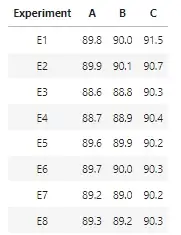

According to this information, conduct the hypothesis testing to check whether there is a difference between the performance of the methods by using a 0.05 significance level. If there is a significant difference, perform further analysis to find which one caused the difference. Before doing hypothesis testing, check the related assumptions. Comment on the results.

1. Defining Hypothesis


*   H₀: μ₁=μ₂=μ₃ or The mean of the samples is the same.
*   H₁: At least one of them is different.




2. Assumption Check


*   H₀: The data is normally distributed.
*   H₁: The data is not normally distributed.



H₀: The variances of the samples are the same.

H₁: The variances of the samples are different.

In [ ]:
method_A=[89.8,89.9,88.6,88.7,89.6,89.7,89.2,89.3]
method_B=[90.0,90.1,88.8,88.9,89.9,90.0,89.0,89.2]
method_C=[91.5,90.7,90.3,90.4,90.2,90.3,90.2,90.3]
check_normality(method_A)
check_normality(method_B)
check_normality(method_C)

print("p value:%.4f" % pvalue_levene)
if pvalue_levene <0.05:
    print("Reject null hypothesis >> The variances of the samples are different.")
else:
    print("Fail to reject null hypothesis >> The variances of the samples are same.")

p value:0.3076
Fail to reject null hypothesis >> The data is normally distributed
p value:0.0515
Fail to reject null hypothesis >> The data is normally distributed
p value:0.0016
Reject null hypothesis >> The data is not normally distributed
p value:0.0012
Reject null hypothesis >> The variances of the samples are different.


#Selecting the Proper Test
There are three groups, but the normality assumption is violated. So, we need to use the nonparametric version of ANOVA for paired data since the accuracy scores are obtained from the same test sets.

In [ ]:
test_stat,p_value = stats.friedmanchisquare(method_A,method_B, method_C)
print("p value:%.4f" % p_value)
if p_value <0.05:
    print("Reject null hypothesis")
else:
    print("Fail to reject null hypothesis")

print(np.round(np.mean(method_A),2), np.round(np.mean(method_B),2), np.round(np.mean(method_C),2))


p value:0.0015
Reject null hypothesis
89.35 89.49 90.49


Decison and conclusion

At this significance level, at least one of the methods has a different performance.

In [ ]:
data = np.array([method_A, method_B, method_C])
posthoc_df=sp.posthoc_wilcoxon(data, p_adjust="holm")
# posthoc_df = sp.posthoc_nemenyi_friedman(data.T) ## another option for the posthoc test

group_names= ["Method A", "Method B","Method C"]
posthoc_df.columns= group_names
posthoc_df.index= group_names
posthoc_df.style.applymap(lambda x: "background-color:violet" if x<0.05 else "background-color: white")


,Method A,Method B,Method C
Method A,1.000000,0.078125,0.023438
Method B,0.078125,1.000000,0.023438
Method C,0.023438,0.023438,1.000000


Method C outperformed others and achieved better accuracy scores than the others.

#The goodness of Fit

An analyst of a financial investment company is curious about the relationship between gender and risk appetite. A random sample was taken of 660 customers from the database. The customers in the sample were classified according to their gender and their risk appetite. The result is given in the following table.


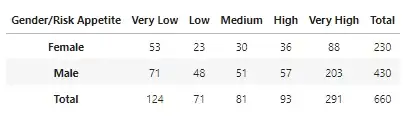

Test the hypothesis that the risk appetite of the customers in this company is independent of their gender. Use α = 0.01.



1. Defining Hypothesis

H₀: Gender and risk appetite are independent.

H₁: Gender and risk appetite are dependent.


Selecting the Proper Test and Assumption Check
chi2 test should be used for this question. This test is known as the goodness-of-fit test. It implies that if the observed data are very close to the expected data.

In [ ]:
from scipy.stats import chi2_contingency

obs =np.array([[53, 23, 30, 36, 88],[71, 48, 51, 57, 203]])
chi2, p, dof, ex = chi2_contingency(obs, correction=False)

print("expected frequencies:\n ", np.round(ex,2))
print("degrees of freedom:", dof)
print("test stat :%.4f" % chi2)
print("p value:%.4f" % p)

expected frequencies:
  [[ 43.21  24.74  28.23  32.41 101.41]
 [ 80.79  46.26  52.77  60.59 189.59]]
degrees of freedom: 4
test stat :7.0942
p value:0.1310


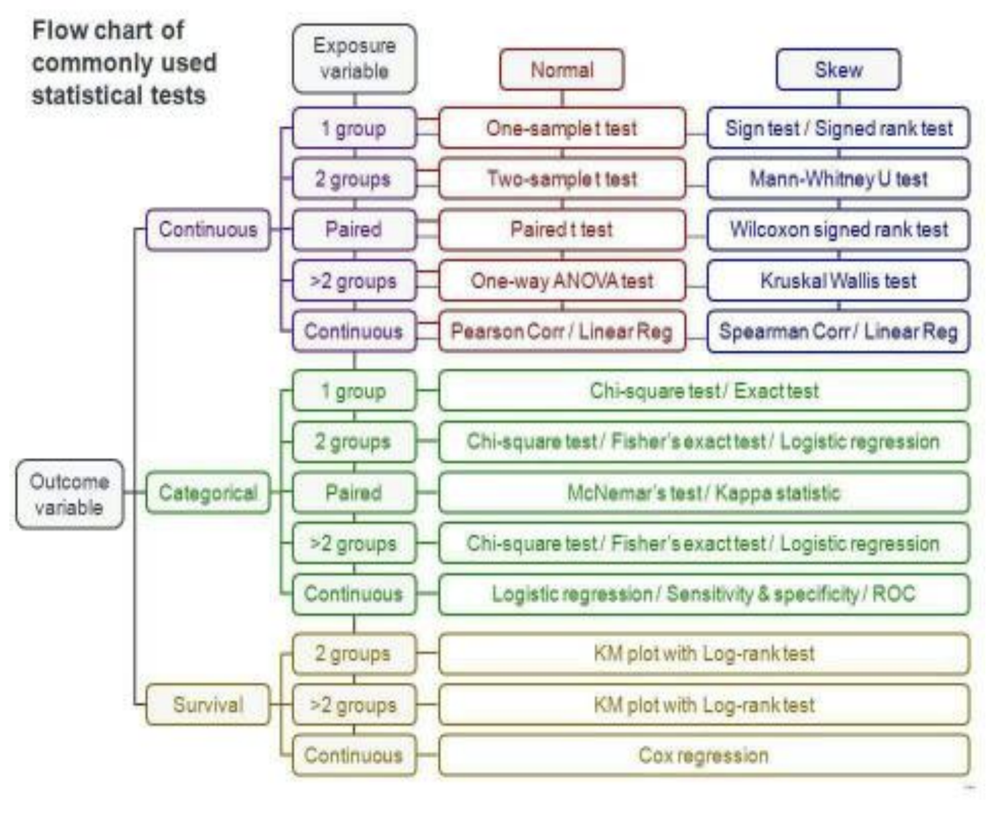

In [ ]:
!pip install dtale

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.4/14.4 MB 46.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 8.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 642.7/642.7 kB 54.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.9/45.9 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 72.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.7/219.7 kB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 88.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 89.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 57.9 MB/s eta 0:00:00
  Created wheel for dash-colorscales: filename=dash_colorscales-0.0.4-py3-none-any.whl size=62566 sha256=7a438de8fd

In [ ]:
# Import necessary libraries
import pandas as pd
import dtale
import dtale.app as dtale_app

dtale_app.USE_COLAB = True

# Load the dataset
data_url = 'https://raw.githubusercontent.com/nethajinirmal13/Training-datasets/main/diabetes.csv'
df = pd.read_csv(data_url)

# Show it using Dtale
d = dtale.show(df)
d


https://2kcj2hfuqjv-496ff2e9c6d22116-40000-colab.googleusercontent.com/dtale/main/1

In [ ]:
!pip install autoviz


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.6/356.6 kB 10.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 61.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 55.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 53.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 40.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.9/121.9 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.9/84.9 kB 2.9 MB/s eta 0:00:00
  Created wheel for emoji: filename=emoji-2.6.0-py2.py3-none-any.whl size=351311 sha256=089be35d360c81a837a96a656e6b686961386dfe134f881d7f75701197c9a666
  Stored in directory: /root/.cache/pip/wheels/ea/0b/64/114bc939d0083621aa41521e21be246c888260b8aa21e6c1ad
Successfully built emoji
  Attempting uninstall: holoviews
  

In [ ]:
# Import necessary libraries
import pandas as pd
from autoviz.AutoViz_Class import AutoViz_Class

# Initialize the AutoViz class
AV = AutoViz_Class()

# Load the dataset
data_url = 'https://raw.githubusercontent.com/nethajinirmal13/Training-datasets/main/diabetes.csv'
df = pd.read_csv(data_url)

# Visualize it using AutoViz
viz = AV.AutoViz(data_url)


Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (768, 9)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    9 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
To fix data quality issues automatically, import FixDQ from autoviz...


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Pregnancies,int64,0.000000,2,0.000000,17.000000,has 4 outliers greater than upper bound (13.50) or lower than lower bound(-6.50). Cap them or remove them.
Glucose,int64,0.000000,17,0.000000,199.000000,has 5 outliers greater than upper bound (202.12) or lower than lower bound(37.12). Cap them or remove them.
BloodPressure,int64,0.000000,6,0.000000,122.000000,has 45 outliers greater than upper bound (107.00) or lower than lower bound(35.00). Cap them or remove them.
SkinThickness,int64,0.000000,6,0.000000,99.000000,has 1 outliers greater than upper bound (80.00) or lower than lower bound(-48.00). Cap them or remove them.
Insulin,int64,0.000000,24,0.000000,846.000000,has 34 outliers greater than upper bound (318.12) or lower than lower bound(-190.88). Cap them or remove them.
BMI,float64,0.000000,NA,0.000000,67.100000,has 19 outliers greater than upper bound (50.55) or lower than lower bound(13.35). Cap them or remove them.
DiabetesPedigreeFunction,float64,0.000000,NA,0.078000,2.420000,has 29 outliers greater than upper bound (1.20) or lower than lower bound(-0.33). Cap them or remove them.
Age,int64,0.000000,6,21.000000,81.000000,has 9 outliers greater than upper bound (66.50) or lower than lower bound(-1.50). Cap them or remove them.
Outcome,int64,0.000000,0,0.000000,1.000000,No issue


Number of All Scatter Plots = 3
All Plots done
Time to run AutoViz = 4 seconds 

 ###################### AUTO VISUALIZATION Completed ########################
